In [1]:
# Imports
from importlib import reload
from matplotlib.backends.backend_pdf import PdfPages
from scipy import sparse
from scipy import stats
from sklearn import neighbors
from sklearn.decomposition import PCA
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.manifold import TSNE
import sklearn
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import cosine_distances
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.neighbors import BallTree
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.preprocessing import KBinsDiscretizer
from umap import UMAP
import anndata as ad
import json
import math
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import polars.selectors as cs
import scanpy as sc
import seaborn as sns
import sklearn as sk
import statsmodels.api as sm
import sys
import typing
import umap
import warnings
warnings.filterwarnings('ignore')
# local imports
#import slamutils
#import plotutils
import exovelo as exo
import re



from scipy.sparse import csr_array, csr_matrix
from scipy.sparse.csgraph import maximum_bipartite_matching

import mygene
import toolz
from toolz import curry
from scipy.stats import mannwhitneyu, brunnermunzel
from sklearn.metrics.pairwise import pairwise_kernels
import scipy
import time
from scipy import linalg
from scipy.sparse.csgraph import shortest_path

/home/zelhar/micromamba/envs/exovelo/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
#exo.tl.creatJE?
#

In [3]:
#import scvelo as scv
import matplotlib

class mplDeprecation(UserWarning):
    pass

matplotlib.cbook.mplDeprecation = mplDeprecation

import scvelo as scv

In [4]:
import os
save_dir = "./plots/test/"
save_dir = os.path.abspath(save_dir)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
print(save_dir, os.path.exists(save_dir))

/home/zelhar/my_gits/exovelo_paper/code/plots/test True


In [5]:
dscvpl = {'color':'phase', 'dpi':300, 'density':0.75, 'arrow_size':2, 'arrow_length':1, 'legend_loc':'on data', 'alpha':0.51, 'legend_fontsize':8}
dsav = {'dpi':300, 'bbox_inches':'tight', 'backend':'cairo', 'transparent':True,}

In [6]:
sc.set_figure_params(dpi=60,) #keep the notebook compact
adata = sc.read_h5ad("./data/rpe1-pulse-varnames-nodmso.h5ad",)
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 2793 × 11463
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time'
    var: 'Gene_Id', 'query', 'scopes', '_id', '_score', 'symbol'
    layers: 'new', 'old', 'sl', 'spliced', 'su', 'total', 'ul', 'unspliced', 'uu'

In [7]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=50)
adata

AnnData object with n_obs × n_vars = 2793 × 11450
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'n_genes'
    var: 'Gene_Id', 'query', 'scopes', '_id', '_score', 'symbol', 'n_cells'
    layers: 'new', 'old', 'sl', 'spliced', 'su', 'total', 'ul', 'unspliced', 'uu'

In [8]:
with open("./data/regev_lab_cell_cycle_genes.txt", 'r') as f:
    cc_genes = f.read().strip().split()
cc_genes = [s.upper() for s in cc_genes]
s_genes = cc_genes[:43]
g2m_genes = cc_genes[43:]
s_genes = np.intersect1d(s_genes, adata.var.symbol.tolist(),)
g2m_genes = np.intersect1d(g2m_genes, adata.var.symbol.tolist(),)
cc_genes = np.intersect1d(cc_genes, adata.var.symbol.tolist(),)

adata
print(len(s_genes), len(g2m_genes))

40 51


In [9]:
adata.X = adata.layers['spliced']
#adata.layers['old'] = adata.layers['su'].copy() + 0.0
#adata.layers['new'] = adata.layers['sl'].copy() + 0.0
#adata.layers['total'] = adata.layers['su'].copy() + adata.layers['sl'].copy() + 0.0
adata.layers['total_su'] = adata.layers['uu'].copy() + adata.layers['ul'].copy() + adata.layers['su'].copy() + adata.layers['sl'].copy() + 0.0

In [10]:
adata.layers['spliced'].sum(), adata.layers['unspliced'].sum()

(25376897.0, 5483145.0)

In [11]:
exo.tl.unsparseAnnData(adata,)
np.allclose(adata.layers['total_su'], adata.layers['spliced'] + adata.layers['unspliced'])

True

In [12]:
sc.pp.normalize_total(
    adata,
    key_added='sizeF',
    inplace=True,
    #target_sum=1e4,
)
np.allclose(adata.layers['total_su'], adata.layers['spliced'] + adata.layers['unspliced'])

True

In [13]:
sc.pp.log1p(adata,)
adata.layers['spliced'].sum(), adata.layers['unspliced'].sum()

(25376897.0, 5483145.0)

In [14]:
sc.pp.highly_variable_genes(adata, n_top_genes=2600, subset=True,)
adata.layers['spliced'].sum(), adata.layers['unspliced'].sum()

(6106269.0, 1597169.0)

In [15]:
with open("./data/regev_lab_cell_cycle_genes.txt", 'r') as f:
    cc_genes = f.read().strip().split()
#cc_genes = [s.capitalize() for s in cc_genes]
cc_genes = [s.upper() for s in cc_genes]
s_genes = cc_genes[:43]
g2m_genes = cc_genes[43:]
s_genes = np.intersect1d(s_genes, adata.var.symbol.tolist(),)
g2m_genes = np.intersect1d(g2m_genes, adata.var.symbol.tolist(),)
cc_genes = np.intersect1d(cc_genes, adata.var.symbol.tolist(),)

print(s_genes)
print(g2m_genes)
print(len(s_genes), len(g2m_genes))

['ATAD2' 'CCNE2' 'CDC6' 'CDCA7' 'DTL' 'GMNN' 'MCM2' 'MCM5' 'PCNA' 'POLD3'
 'UNG']
['ANLN' 'AURKA' 'AURKB' 'BIRC5' 'BUB1' 'CDC20' 'CDCA2' 'CDCA3' 'CDCA8'
 'CDK1' 'CENPA' 'CENPE' 'CENPF' 'CKAP2' 'CKAP5' 'CKS1B' 'CKS2' 'DLGAP5'
 'ECT2' 'G2E3' 'GAS2L3' 'HJURP' 'HMGB2' 'HMMR' 'KIF11' 'KIF20B' 'KIF23'
 'KIF2C' 'MKI67' 'NEK2' 'NUF2' 'NUSAP1' 'PSRC1' 'SMC4' 'TACC3' 'TMPO'
 'TOP2A' 'TPX2' 'TTK' 'UBE2C']
11 40


In [16]:
sc.pp.scale(adata, max_value=10,)
sc.pp.pca(adata, n_comps=50,)
sc.pp.neighbors(adata, n_neighbors=30,)
sc.tl.umap(adata,)
sc.tl.leiden(adata, flavor="igraph", n_iterations=2, directed=False)

In [17]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['time'] == 0.25)[0]
sc.tl.diffmap(adata, )
sc.tl.dpt(adata, )

In [18]:
sc.tl.draw_graph(adata)
sc.tl.tsne(adata, )
n = adata.n_obs
adata.X.sum(1)

array([ 2.3513930178e+02,  6.6456418189e+01, -8.9672658695e+01, ...,
       -1.2379235394e+01,  1.3037680174e+02,  4.8432204120e-03])

In [19]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

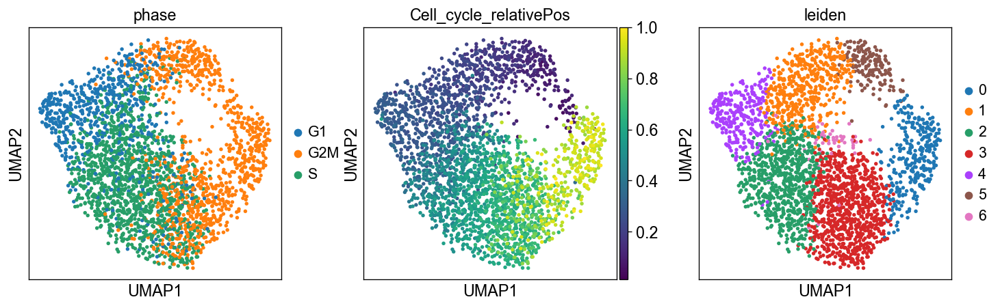

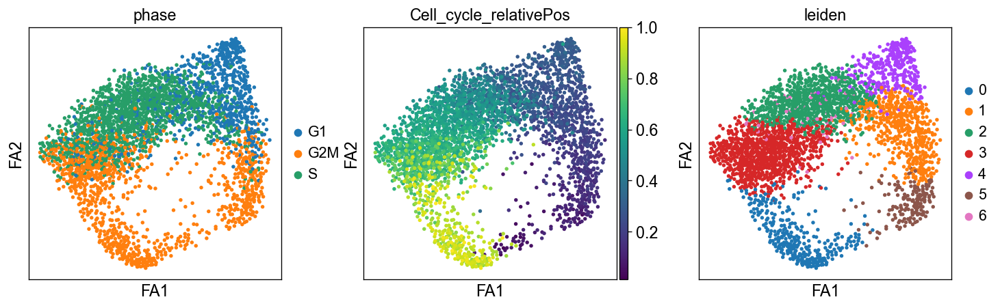

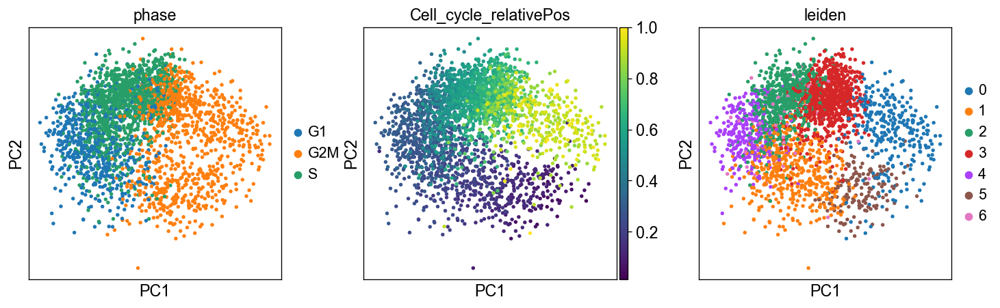

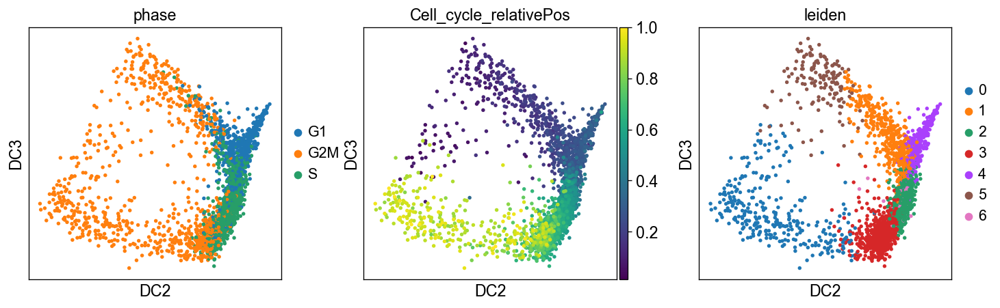

In [20]:
sc.pl.umap(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden', ], color_map='viridis', alpha=1, )
sc.pl.draw_graph(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden' ,], color_map='viridis', alpha=1, )
sc.pl.pca(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden' ,], dimensions=[(0,1)], color_map='viridis', alpha=1, )
sc.pl.diffmap(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden' ,], dimensions=[(1,2)], color_map='viridis', alpha=1, )

In [21]:
## Remove cluster which seems to not belong
adata = adata[adata.obs.leiden != '6']
adata.obs.leiden
adata

View of AnnData object with n_obs × n_vars = 2745 × 2600
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'n_genes', 'sizeF', 'leiden', 'dpt_pseudotime', 'S_score', 'G2M_score', 'phase'
    var: 'Gene_Id', 'query', 'scopes', '_id', '_score', 'symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'iroot', 'diffmap_evals', 'draw_graph', 'tsne', 'phase_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap', 'X_draw_graph_fa', 'X_tsne'
    varm: 'PCs'
    layers: 'new', 'old', 'sl', 'spliced', 'su', 'total', 'ul', 'unspliced', 'uu', 'total_su'
    obsp: 'distances', 'connectivities'

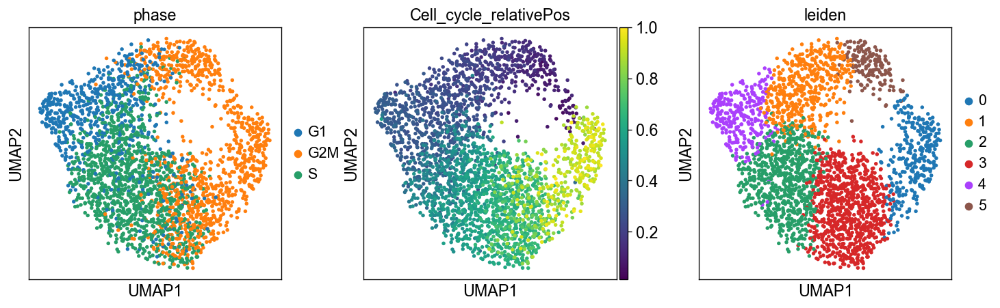

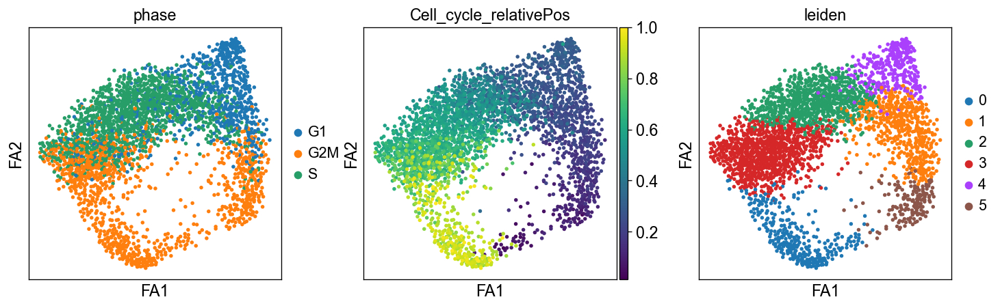

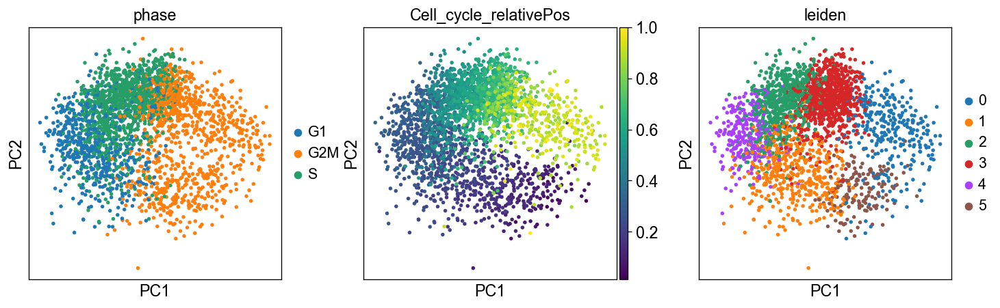

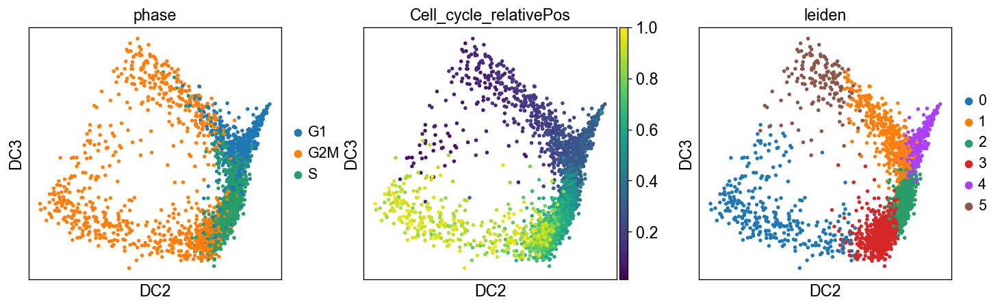

In [22]:
sc.pl.umap(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden', ], color_map='viridis', alpha=1,  )
sc.pl.draw_graph(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden' ,], color_map='viridis', alpha=1,  )
sc.pl.pca(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden' ,], dimensions=[(0,1)], color_map='viridis', alpha=1,  )
sc.pl.diffmap(adata, color=['phase', 'Cell_cycle_relativePos', 'leiden' ,], dimensions=[(1,2)], color_map='viridis', alpha=1,  )

In [23]:
#tots = adata.layers['total_su'].sum(axis=1, keepdims=True,)
#sp = adata.layers['spliced'].sum(axis=1, keepdims=True,)
#usp = adata.layers['unspliced'].sum(axis=1, keepdims=True,)
#factor = 1e4
#adata.layers['RRn'] = normalize(adata.layers['total_su'], axis=1, norm='l1') * factor
#adata.layers['Sn'] = normalize(adata.layers['spliced'], axis=1, norm='l1') * factor * sp / tots

adata.layers['RRn'] = sc.pp.normalize_total(adata, layer='total_su', inplace=False)['X']
adata.layers['Sn'] = sc.pp.normalize_total(adata, layer='spliced', inplace=False)['X']
adata.layers['Un'] = sc.pp.normalize_total(adata, layer='unspliced', inplace=False)['X']


#adata.layers['RRnl'] = np.nan_to_num(np.log(adata.layers['RRn']), neginf=np.log(1e-1))
#adata.layers['Snl'] = np.nan_to_num(np.log(adata.layers['Sn']), neginf=np.log(1e-1))
adata.layers['RRnl'] = np.log(1 + adata.layers['RRn'])
adata.layers['Snl'] = np.log(1 + adata.layers['Sn'])
adata.layers['Unl'] = np.log(1 + adata.layers['Un'])

scaler = StandardScaler
adata.layers['Sn_st'] = scaler().fit_transform(adata.layers['Sn'])
adata.layers['RRn_st'] = scaler().fit_transform(adata.layers['RRn'])
adata.layers['Un_st'] = scaler().fit_transform(adata.layers['Un'])

adata.layers['Snl_st'] = scaler().fit_transform(adata.layers['Snl'])
adata.layers['RRnl_st'] = scaler().fit_transform(adata.layers['RRnl'])
adata.layers['Unl_st'] = scaler().fit_transform(adata.layers['Unl'])


adata.layers['Rn'] = sc.pp.normalize_total(adata, layer='total', inplace=False)['X']
adata.layers['On'] = sc.pp.normalize_total(adata, layer='old', inplace=False)['X']

adata.layers['Rnl'] = np.nan_to_num(np.log(adata.layers['Rn']), neginf=np.log(1e-1))
adata.layers['Onl'] = np.nan_to_num(np.log(adata.layers['On']), neginf=np.log(1e-1))

#reload(slamutils)
reload(exo)
exo.tl.standardize(
    adata,
    layers=['Rn', 'On', 'Rnl', 'Onl'],
    by_key='time',
    suffix='_sst',
)

adata

AnnData object with n_obs × n_vars = 2745 × 2600
    obs: 'Plate_Id', 'Condition_Id', 'Well_Id', 'RFP_log10_corrected', 'GFP_log10_corrected', 'Cell_cycle_possition', 'Cell_cycle_relativePos', 'exp_type', 'time', 'n_genes', 'sizeF', 'leiden', 'dpt_pseudotime', 'S_score', 'G2M_score', 'phase'
    var: 'Gene_Id', 'query', 'scopes', '_id', '_score', 'symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'iroot', 'diffmap_evals', 'draw_graph', 'tsne', 'phase_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap', 'X_draw_graph_fa', 'X_tsne'
    varm: 'PCs'
    layers: 'new', 'old', 'sl', 'spliced', 'su', 'total', 'ul', 'unspliced', 'uu', 'total_su', 'RRn', 'Sn', 'Un', 'RRnl', 'Snl', 'Unl', 'Sn_st', 'RRn_st', 'Un_st', 'Snl_st', 'RRnl_st', 'Unl_st', 'Rn', 'On', 'Rnl', 'Onl', 'Rn_sst', 'On_sst', 'Rnl_sst', 'Onl_sst'
    obsp: 'distances', 'connectivities'

In [24]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', key_added="rank_leiden",)
mygenes = np.array(adata.uns['rank_leiden']['names'][:300].flatten().tolist()).flatten().tolist()
print(len(mygenes), )

1800


In [25]:
n_genes = (len(mygenes) // 100) * 50
n_genes

900

In [26]:
n = adata.n_obs
n_components = 50 
X = adata[:,mygenes[:n_genes]].layers['Snl_st'].copy() 
Y = adata[:,mygenes[:n_genes]].layers['RRnl_st'].copy()
X,Y = exo.tl.quantile_normalize_paired_matrices(X,Y)
X = scaler().fit_transform(X)
Y = scaler().fit_transform(Y)

In [27]:
n = adata.n_obs
n_components = 50 
X = adata[:,mygenes[:n_genes]].layers['Onl_sst'].copy() 
Y = adata[:,mygenes[:n_genes]].layers['Rnl_sst'].copy()
X,Y = exo.tl.quantile_normalize_paired_matrices(X,Y)
X = scaler().fit_transform(X)
Y = scaler().fit_transform(Y)

In [28]:
n = adata.n_obs
n_components = 50 
X = adata[:,mygenes[:n_genes]].layers['Onl_sst'].copy() 
Y = adata[:,mygenes[:n_genes]].layers['Rnl_sst'].copy()
#X,Y = exo.tl.quantile_normalize_paired_matrices(X,Y)

In [29]:
dX = Y - X
XY = np.concatenate((X,Y), axis=0)
pca = PCA(n_components=n_components,).fit(XY)
Xp = pca.transform(X)
Yp = pca.transform(Y)
treeX = BallTree(Xp, metric='minkowski', p=2)
k=16
distXX, indXX = treeX.query(Xp, k=k)
Z = X + dX[indXX].mean(1)
Zp = pca.transform(Z)

In [30]:
adata.obsm

AxisArrays with keys: X_pca, X_umap, X_diffmap, X_draw_graph_fa, X_tsne

In [31]:
reload(exo)
import slamutils
reload(slamutils)
#adata.obsm['velocity_umap'] = exo.tl.projectVelocity(Xp,Yp, adata.obsm['X_umap'], k=9,)
adata.obsm['velocity_umap'] = slamutils.projectVelocity(Xp,Zp, adata.obsm['X_umap'], k=9, smooth=True,)

In [32]:
dsav = {'dpi':300, 'bbox_inches':'tight', 'backend':'cairo', 'transparent':True,}
dscvpl = {
    'color':'phase', 'color_map':'viridis', 'dpi':300, 'density':0.50, 'arrow_size':2.0,
    'arrow_length':1.0, 'legend_loc':'on data', 'alpha':0.51, 'legend_fontsize':8, 'title' : '',
         }

<Axes: >

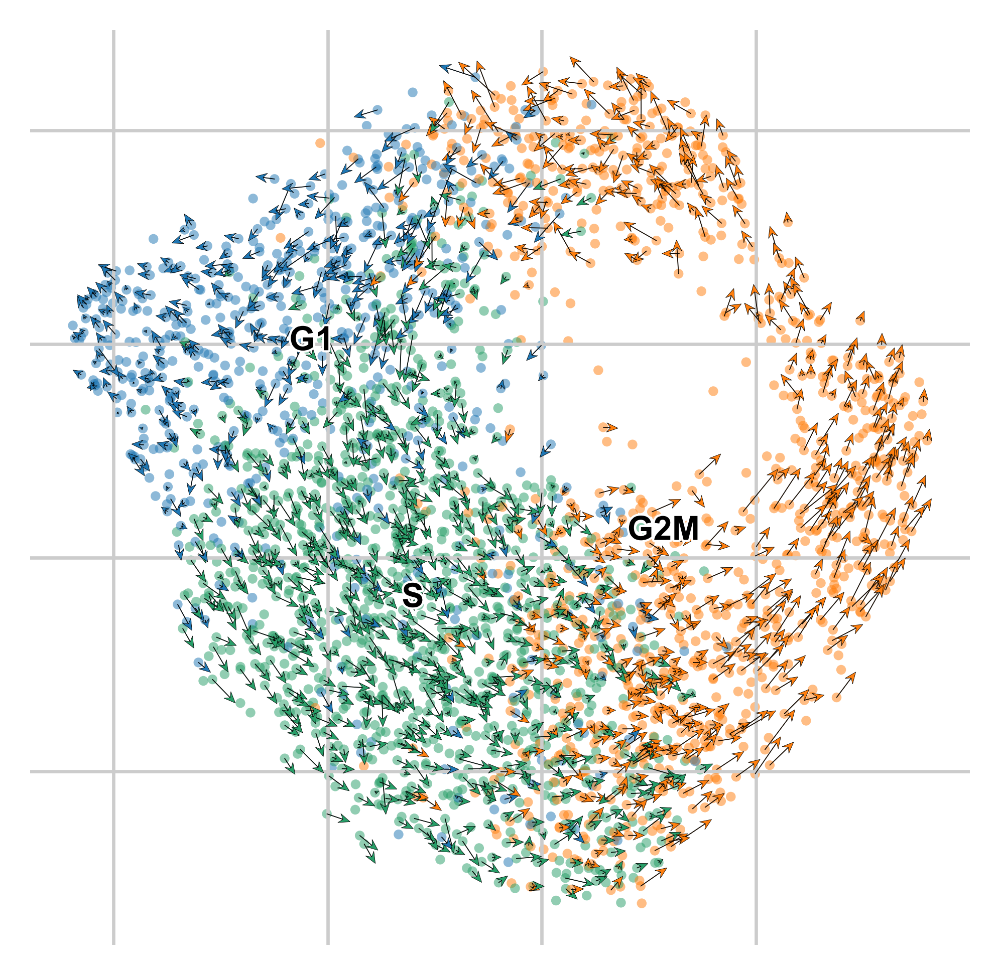

In [33]:
scv.pl.velocity_embedding(adata, basis='umap',show=False, **dscvpl, )

In [34]:
reload(slamutils)

<module 'slamutils' from '/home/zelhar/my_gits/exovelo_paper/code/slamutils.py'>

In [35]:
bdata = adata[:,mygenes[:n_genes]].copy() 
bdata.layers['O_special'] = X.copy()
bdata.layers['R_special'] = Y.copy()

In [36]:
reload(slamutils)
slamutils.createJE(adata=bdata, do_diffmap=True, do_drawgraph=True, do_umap=True, smooth=False, X_key='O_special', Y_key='R_special',)

In [37]:
bdata.obsm

AxisArrays with keys: X_pca, X_umap, X_diffmap, X_draw_graph_fa, X_tsne, velocity_umap, X_je_pca, velocity_je_pca, X_je_umap, velocity_je_umap, X_je_draw_graph_fa, velocity_je_draw_graph_fa, X_je_diffmap, velocity_je_diffmap

In [38]:
bdata.obsm['X_umap'], bdata.obsm['X_je_umap']

(array([[ 6.242806  , -5.516903  ],
        [ 0.90423626, -2.2567174 ],
        [ 1.3234096 , -5.1022215 ],
        ...,
        [ 1.8405018 , -7.6623487 ],
        [-2.7252405 , -4.371445  ],
        [ 1.1939026 , -6.8811197 ]], dtype=float32),
 array([[ 1.4355092, 11.8725   ],
        [ 6.2757673, 11.098519 ],
        [ 5.8937035, 14.011419 ],
        ...,
        [ 4.759404 , 14.063669 ],
        [10.671771 , 14.302598 ],
        [ 5.3351607, 14.806936 ]], dtype=float32))

<Axes: >

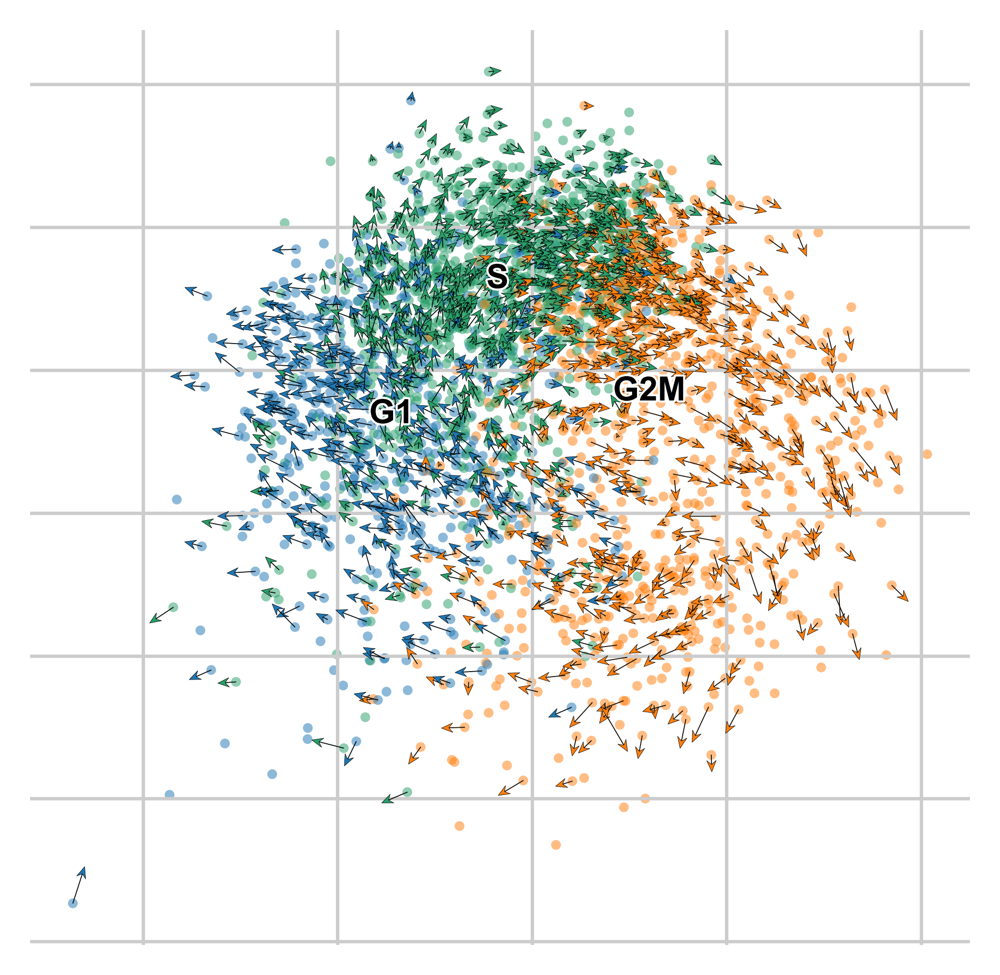

In [39]:
scv.pl.velocity_embedding(bdata, basis='je_pca',show=False, **dscvpl, )

<Axes: >

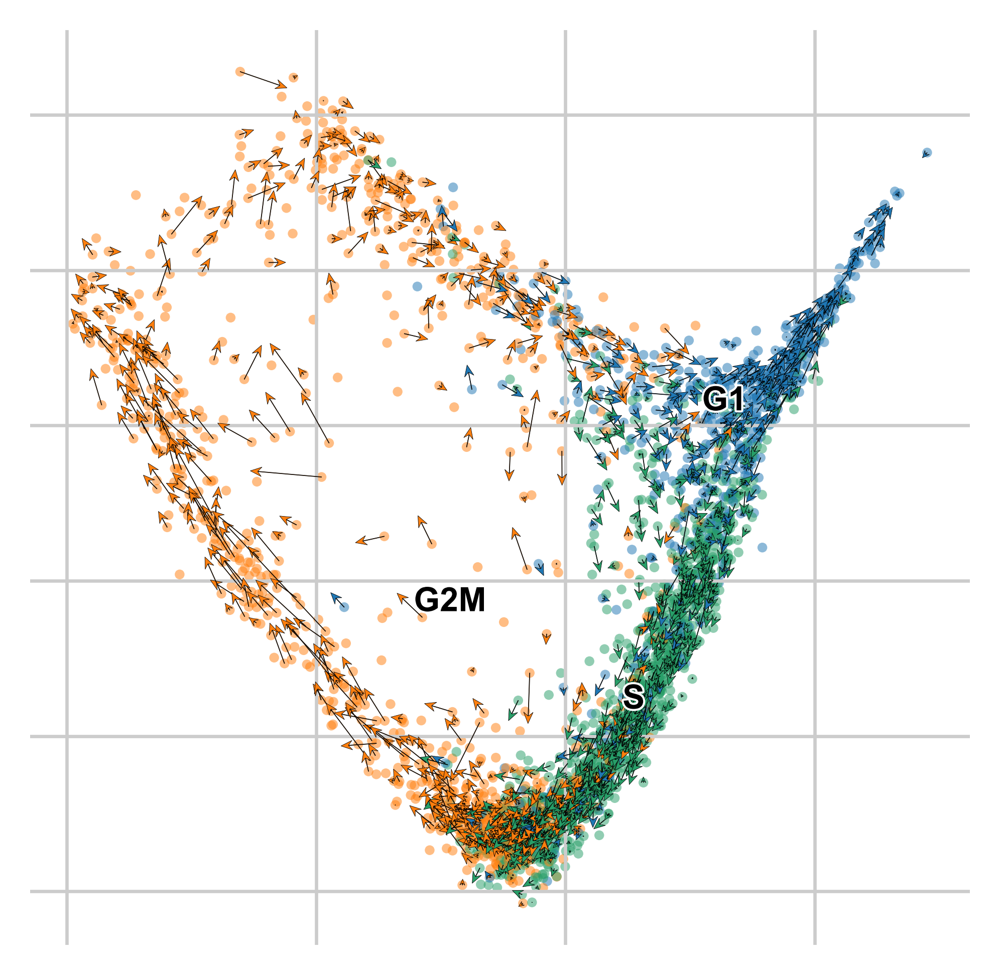

In [40]:
scv.pl.velocity_embedding(bdata, basis='je_diffmap',show=False, **dscvpl, )

<Axes: >

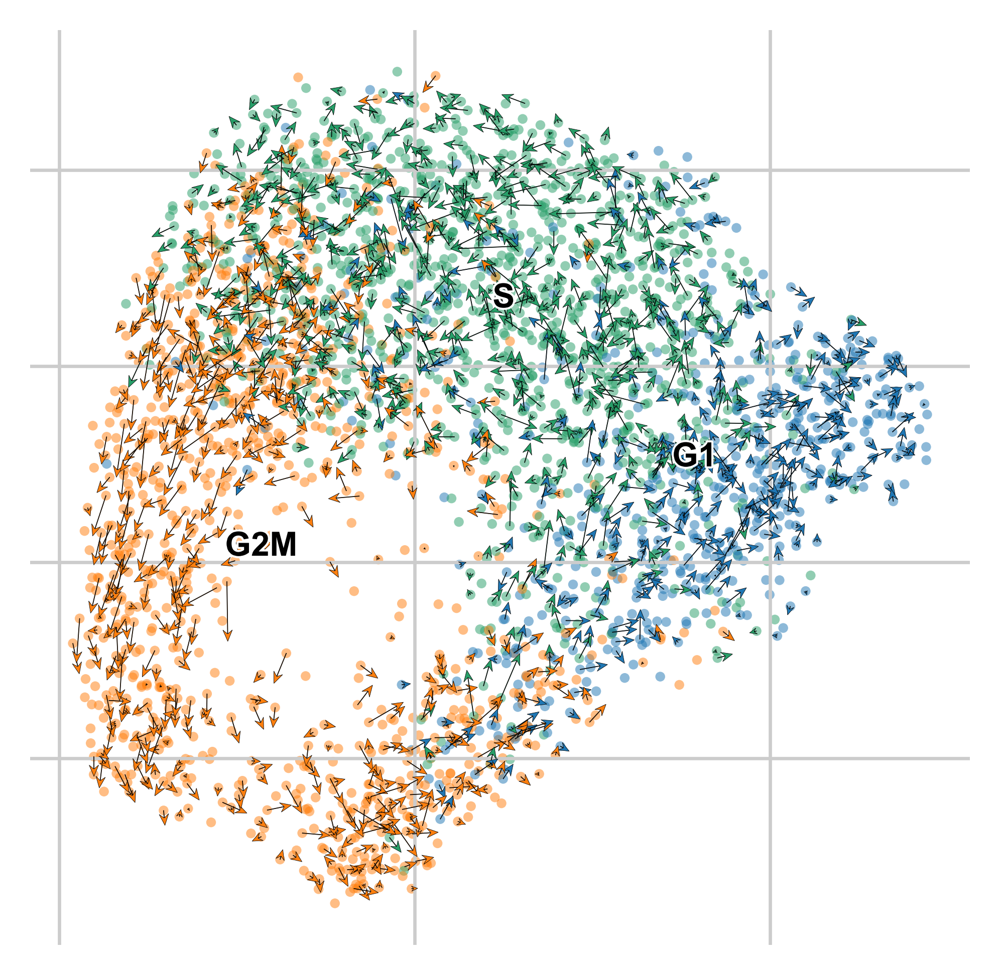

In [41]:
scv.pl.velocity_embedding(bdata, basis='je_umap',show=False, **dscvpl, )

In [42]:
g = g2m_genes[1]
g =s_genes[4]
x = adata[:,g].layers['old'].flatten()
y = adata[:,g].layers['total'].flatten()
x = adata[:,g].layers['spliced'].flatten()
y = adata[:,g].layers['total_su'].flatten()
x = adata[:,g].layers['Onl_sst'].flatten()
y = adata[:,g].layers['Rnl_sst'].flatten()
x = adata[:,g].layers['Snl_st'].flatten()
y = adata[:,g].layers['RRnl_st'].flatten()
x = adata[:,g].layers['Snl'].flatten()
y = adata[:,g].layers['RRnl'].flatten()
x = adata[:,g].layers['Sn'].flatten()
y = adata[:,g].layers['RRn'].flatten()
c = adata.obs['phase']
c = adata.obs['leiden']
df = pd.DataFrame({'x': x, 'y':y, 'c': c})

<Axes: xlabel='x', ylabel='Density'>

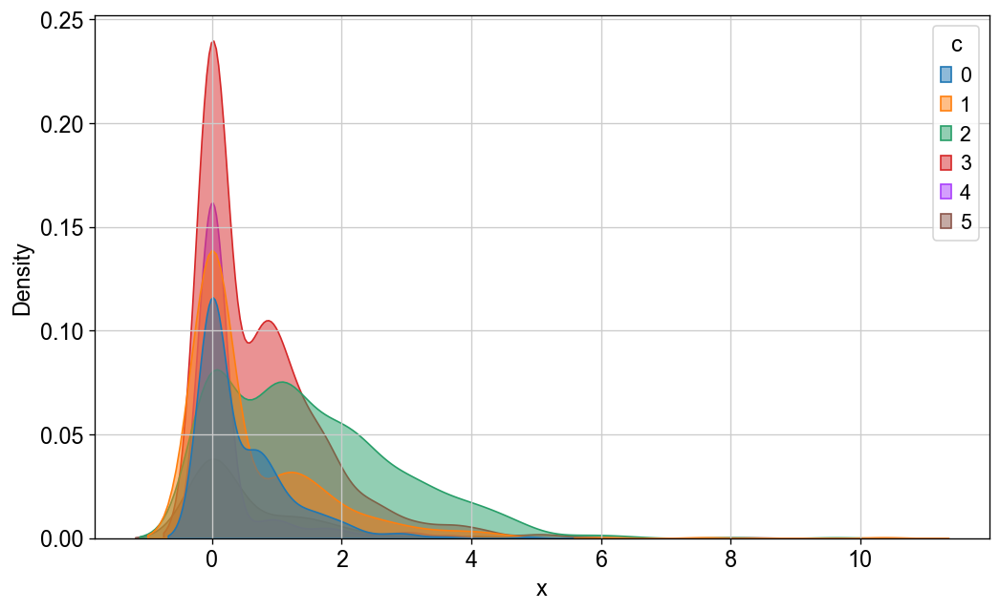

In [43]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='x', hue='c', fill=True, alpha=0.5)

<Axes: xlabel='y', ylabel='Density'>

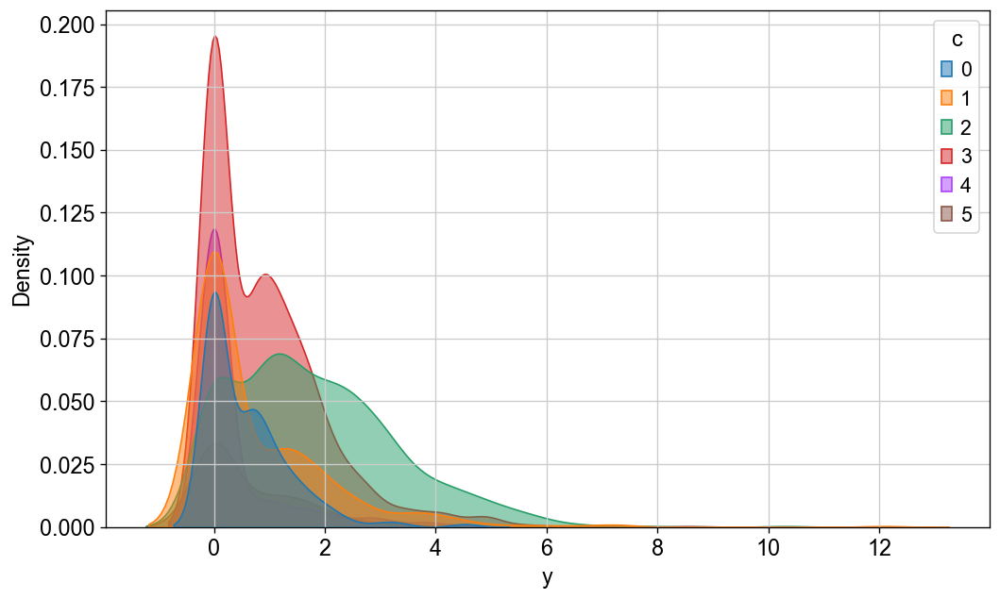

In [44]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='y', hue='c', fill=True, alpha=0.5)

(array([1.1412534782e+00, 2.1070686245e-01, 2.8757417278e-01,
        2.2336736062e-01, 1.7362968923e-01, 1.1846609005e-01,
        9.4049414999e-02, 6.6919776057e-02, 4.2503101009e-02,
        3.3459888028e-02, 2.8938281538e-02, 2.1703711154e-02,
        1.5373462067e-02, 8.1388916826e-03, 6.3302490865e-03,
        1.8086425961e-03, 1.8086425961e-03, 1.8086425961e-03,
        9.0432129807e-04, 9.0432129807e-04, 0.0000000000e+00,
        9.0432129807e-04, 0.0000000000e+00, 0.0000000000e+00,
        0.0000000000e+00, 9.0432129807e-04, 0.0000000000e+00,
        0.0000000000e+00, 0.0000000000e+00, 9.0432129807e-04]),
 array([ 0.          ,  0.4028421378,  0.8056842756,  1.2085264133,
         1.6113685511,  2.0142106889,  2.4170528267,  2.8198949645,
         3.2227371023,  3.62557924  ,  4.0284213778,  4.4312635156,
         4.8341056534,  5.2369477912,  5.6397899289,  6.0426320667,
         6.4454742045,  6.8483163423,  7.2511584801,  7.6540006179,
         8.0568427556,  8.4596848934, 

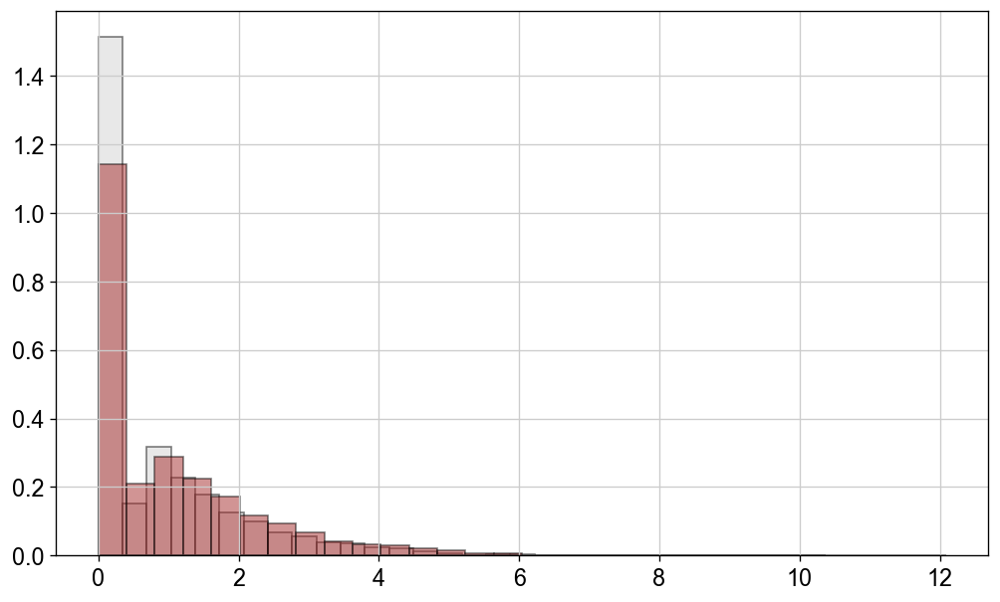

In [45]:
plt.figure(figsize=(10, 6))
plt.hist(x, bins=30, color='lightgray', density=True, alpha=0.5, edgecolor='black')
plt.hist(y, bins=30, color='brown', density=True, alpha=0.5, edgecolor='black')